In [ ]:
import sklearn.cluster 
import pandas as pd 
import numpy as np
import seaborn as sns 

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data = 'https://raw.githubusercontent.com/99sambhav/uber_Ridesharing_clusteering/main/Copy%20of%20uber-raw-data-apr14.csv'
april = pd.read_csv(data)

In [ ]:
april

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
564511,4/30/2014 23:22:00,40.7640,-73.9744,B02764
564512,4/30/2014 23:26:00,40.7629,-73.9672,B02764
564513,4/30/2014 23:31:00,40.7443,-73.9889,B02764
564514,4/30/2014 23:32:00,40.6756,-73.9405,B02764


In [ ]:
april['Date/Time'] = pd.to_datetime(april['Date/Time'] ,format= "%m/%d/%Y %H:%M:%S")
april['Time'] = april['Date/Time'].dt.time.apply(lambda x: int(x.strftime('%H%M%S')))

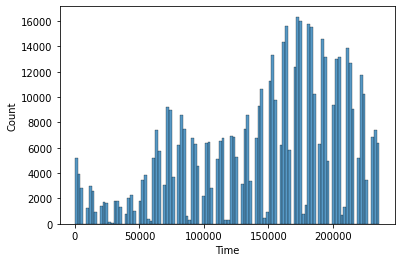

In [ ]:
sns.histplot(april['Time'])

**Maximum no of rides is between 15:00 to 20:00 so i it as evening booking traffic
and from 8:00 - 10:00 in morning therefore it is called morning traffic**



In [ ]:
morning_dataset= april[ (april['Time'] > 80000 ) & (april['Time'] < 100000) ]
evening_dataset= april[ (april['Time'] > 170000 ) & (april['Time'] < 200000) ]

In [ ]:
morning_loc = morning_dataset[['Lat','Lon']].sample(10000 ,random_state =12 ).values
evening_loc = evening_dataset[['Lat','Lon']].sample(10000 ,random_state =12 ).values

In [ ]:
!pip install folium

In [ ]:
import folium

**i have use folium to plot map and location is find using google**

In [ ]:
morning_map = folium.Map(location=[40.79658011772687, -73.87341741832425], zoom_start = 12, tiles='Stamen Toner')

for cordinates in morning_loc:
  folium.CircleMarker(radius=1 ,location=cordinates , fill =True ).add_to(morning_map)
morning_map

In [86]:
evening_map = folium.Map(location=[40.79658011772687, -73.87341741832425], zoom_start = 12, tiles='Stamen Toner')
for cordinates in evening_loc:
  folium.CircleMarker(radius=1 ,location=cordinates ,color='#FF0000' ,fill =True ).add_to(evening_map)
evening_map

In [ ]:
from sklearn.cluster import KMeans 
model = KMeans(n_clusters=6 ,max_iter =350 ,init= 'random')

In [ ]:
morning_model =model
morning_model.fit(morning_dataset[['Lat','Lon']])
morning_centers = morning_model.cluster_centers_
morning_centers

array([[ 40.77252488, -73.96824237],
       [ 40.73299347, -73.99488009],
       [ 40.70071679, -74.20566277],
       [ 40.68582404, -73.75414788],
       [ 40.68800316, -73.9655222 ],
       [ 40.78944406, -73.86990799]])

In [ ]:
evening_model =model
evening_model.fit(evening_dataset[['Lat','Lon']])
evening_centers = evening_model.cluster_centers_
evening_centers

array([[ 40.65600991, -73.77604709],
       [ 40.68886104, -73.968438  ],
       [ 40.69935078, -74.19902967],
       [ 40.73043879, -73.99951498],
       [ 40.7625962 , -73.97435708],
       [ 40.79135442, -73.86808445]])

In [ ]:
for i ,loc in enumerate(morning_centers):
  folium.Marker(location=loc ,popup=f"center{i+1}" ,icon =folium.Icon(color='Green') ).add_to(morning_map)
morning_map

In [ ]:
evening_map1 = folium.Map(location=[40.79658011772687, -73.87341741832425], zoom_start = 12, tiles='Stamen Toner')
for i ,eloc in enumerate(evening_centers):
  folium.Marker(location=eloc ,popup=f"center{i+1}" ,icon =folium.Icon(color='Green') ).add_to(evening_map1)
evening_map1

**if suppose there is request for cab at location 40.70647056912189, -73.91116590442799 in evening time**

In [ ]:
new_ride = (40.70647056912189, -73.91116590442799)
folium.Marker(location =new_ride ,popup="CAB DEMAND", icon =folium.Icon(color ='green')).add_to(evening_map1)


In [ ]:
center_idx = evening_model.predict([new_ride])
evening_centers[center_idx]
folium.Marker(location =evening_centers[center_idx][0] ,popup="going_cab", icon =folium.Icon(color ='blue')).add_to(evening_map1)
evening_map1

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  "X does not have valid feature names, but"


**in above map green popup marker is demand of cab at that location and in blue popup marker is nearest cab which should go to recieve the customer**

**following above red pop is is locations at which uber should always place its cab in evening slots respectively and small red circle is location of cabs in month of april**